## The calibration of the VIX implied volatility expansion

### 1. Data preprocessing

Let us first check the information about this dataset for the VIX implied volatility collected in 2023-02-15.

In [1]:
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd

data_path = r"C:\Users\Spencer\Desktop\Chapter2\Data\vix_implied_vol_20230215.csv"

df = pd.read_csv(data_path)

print("The data for the first row: ")
print(df.iloc[0].to_dict())

has_nan = df.isna().values.any()
print("\n Check if there exists the NaN: ", has_nan)

missing_per_col = df.isna().sum()
print("\n The missing value in each column: ")
print(missing_per_col)

The data for the first row: 
{'Unnamed: 0': 0.0, 'Expiry': 20230222.0, 'Texp': 0.0191649555099247, 'Strike': 10.0, 'Bid': nan, 'Ask': 2.086123640771815, 'Fwd': 20.1951741855249, 'CallMid': nan}

 Check if there exists the NaN:  True

 The missing value in each column: 
Unnamed: 0      0
Expiry          0
Texp            0
Strike          0
Bid           122
Ask             0
Fwd             0
CallMid       122
dtype: int64


From the above output, we observe that the dataset contains eight columns. `The first column contains the row index, so we can discard it.` The values in the second column appear unusual; however, they are likely in datetime format, since the column header is 'Expiry'. The label of the third column is not clear. Based on the values in column 'Strike' and 'Fwd', we infer that this column represents a percentage. In addition, we find that there are some missing values in the 'Bid' column. This may be because VIX options are illiquid at certain strike prices. `Therefore, we exclude VIX implied volatility data points that have missing 'Bid' values.`

In [3]:
import utils
import numpy as np

df['Expiry'] = df['Expiry'].astype('Int64').astype(str)
df['Expiry'] = pd.to_datetime(df['Expiry'], format='%Y%m%d')

collection_date = pd.to_datetime('2023-02-15')

ttm_unique = np.sort(
    df['Expiry']
      .apply(lambda dt: utils.year_fraction(start_dt=collection_date, end_dt=dt))
      .unique()
)

texp_unique = np.sort(
    df['Texp'].unique()
)

print('Time to maturity: ', ttm_unique)
print('\n The unique value in column [Texp]:', texp_unique)

Time to maturity:  [0.01917808 0.03835616 0.05479452 0.07671233 0.09589041 0.17260274
 0.24931507 0.34520548 0.42191781 0.49863014 0.59452055 0.67123288]

 The unique value in column [Texp]: [0.01916496 0.03832991 0.05475702 0.07665982 0.09582478 0.1724846
 0.24914442 0.3449692  0.42162902 0.49828884 0.59411362 0.67077344]


From the above output, we find tha the values in column 'Texp' is the time-to-maturity, but there are slightly different from the value we compute using the ACT/365. `Thus, we will directly use the time-to-maturity in column 'Texp'.`

In [4]:
df = df.dropna(subset=['Bid']).copy()

df['Strike'] = df['Strike'] / 100
df['Fwd'] = df['Fwd'] / 100
df['Mid'] = (df['Bid'] + df['Ask']) / 2.0

### 2. Data visualization

#### 2.1 VIX futures


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("talk")
sns.set_style("darkgrid")

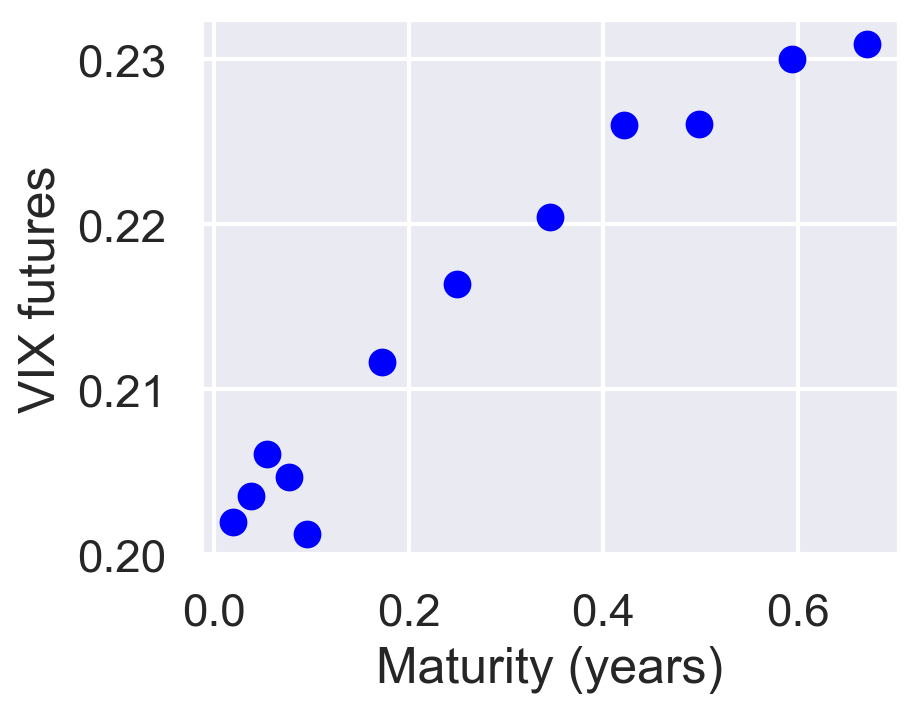

In [6]:
plot_data = df.groupby('Texp')['Fwd'].first().reset_index()
plot_data = plot_data.sort_values(by='Texp')

x_texp = plot_data['Texp']
y_fwd = plot_data['Fwd']

plt.figure(figsize=(4.5, 3.5))

plt.plot(x_texp, y_fwd, marker='o', linestyle='None', color="blue")

plt.xlabel('Maturity (years)')
plt.ylabel('VIX futures')

plt.show()

#### 2.2 VIX smiles

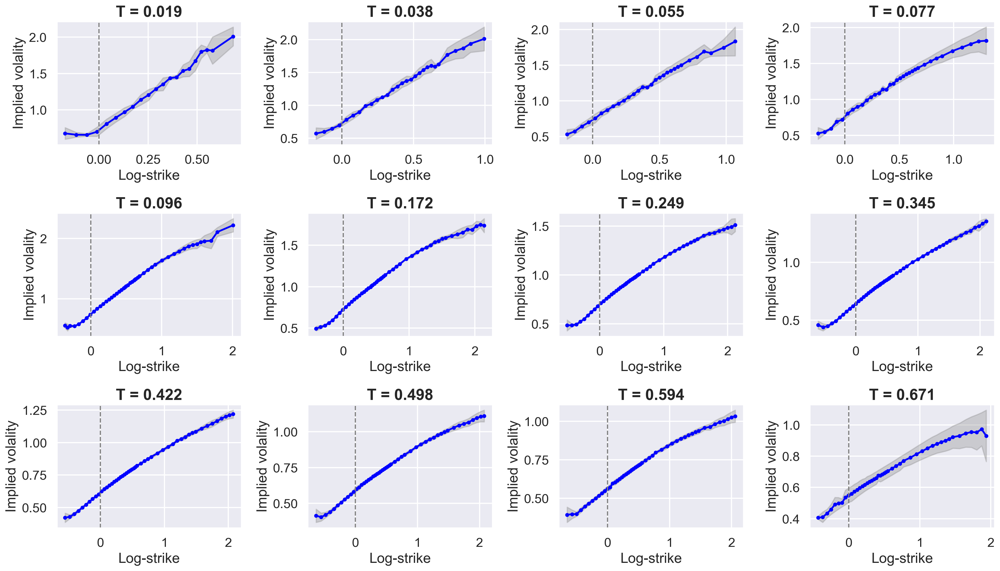

In [7]:
groups = list(df.groupby('Texp'))
n_groups = len(groups)

ncols = 4
nrows = int(np.ceil(n_groups / float(ncols)))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4.5, nrows * 3.5))
axes_flat = axes.flatten()

for i, (T, g) in enumerate(groups):
    
    ax = axes_flat[i]

    fwd_mkt = g['Fwd'].unique()[0]
    strikes = g['Strike']
    mid_ivs = g['Mid']
    bid_ivs = g['Bid']
    ask_ivs = g['Ask']
    log_strikes = np.log(strikes / fwd_mkt)

    sort_indices = np.argsort(log_strikes)
    x_sorted = log_strikes.iloc[sort_indices]
    y_mid_sorted = mid_ivs.iloc[sort_indices]
    y_bid_sorted = bid_ivs.iloc[sort_indices]
    y_ask_sorted = ask_ivs.iloc[sort_indices]

    ax.fill_between(
        x_sorted, 
        y_bid_sorted,
        y_ask_sorted,
        color="gray",
        alpha=0.3,
    )

    ax.plot(
        x_sorted, 
        y_mid_sorted, 
        marker='o',
        linestyle='-',
        color='blue',
        markersize=4,
        label="Mid IV"
    )
    
    ax.axvline(x=0, color='grey', linestyle='--', linewidth=1.5)

    ax.set_title(f"T = {T:.3f}", fontsize=20, fontweight='bold')
    ax.set_xlabel("Log-strike")
    ax.set_ylabel("Implied volality")

for j in range(n_groups, nrows * ncols):
    axes_flat[j].axis('off')

plt.tight_layout()
plt.show()

### 3. Calibration procedure

#### 3.1 Calibration to one maturity

Following the calibration procedure described in the paper, we first calibrate the VIX implied volatility obtained via the root-finding method in the mixed rough Bergomi model to assess the feasibility of this approach. Details of the calibration procedure can be found in the paper.

##### 3.1.1 The root-finding method

In [8]:
import calibration
import root_finding

H = 0.1
N_GAUSS = 120
params_init_fixed = [2.0, 0.2, 0.02, 0.5]

In [9]:
df_calibrated_results_fixed = root_finding.root_finding_calib_fixed(
    market_data_df=df, 
    H=H, 
    N_GAUSS=N_GAUSS, 
    params_init_fixed=params_init_fixed
)

Using 15 cores for parallel processing.

Calibration results (Parameters) - Fixed Guess:
              eta1      eta2    H       xi0       lbd      cost
T                                                              
0.019165  2.000000  0.200000  0.1  0.043692  0.500000  6.693987
0.038330  2.000000  0.200000  0.1  0.046470  0.500000  5.137228
0.054757  2.000000  0.200000  0.1  0.049113  0.500000  3.881166
0.076660  2.000000  0.200000  0.1  0.050058  0.500000  2.195813
0.095825  1.997872  0.199284  0.1  0.049527  0.499641  1.670357
0.172485  1.999414  0.200000  0.1  0.058620  0.498568  0.472149
0.249144  2.000000  0.200000  0.1  0.064239  0.500000  0.230874
0.344969  2.000000  0.329452  0.1  0.072118  0.500000  0.191187
0.421629  2.000000  0.329452  0.1  0.077973  0.500000  0.114425
0.498289  2.000000  0.204282  0.1  0.076734  0.500786  0.221481
0.594114  2.000000  0.210887  0.1  0.081711  0.504296  0.218498
0.670773  2.000000  0.200000  0.1  0.082913  0.500000  0.203020


From the calibration results, we find that the calibrated parameter values remain close to the initial guesses. This is mainly because the optimization method used in the paper, `scipy.optimize.least_squares`, is highly dependent on the choice of initial parameter values. Nevertheless, we plot the results to assess the quality of the calibration.

(1) Calibration results for the VIX futures term structure

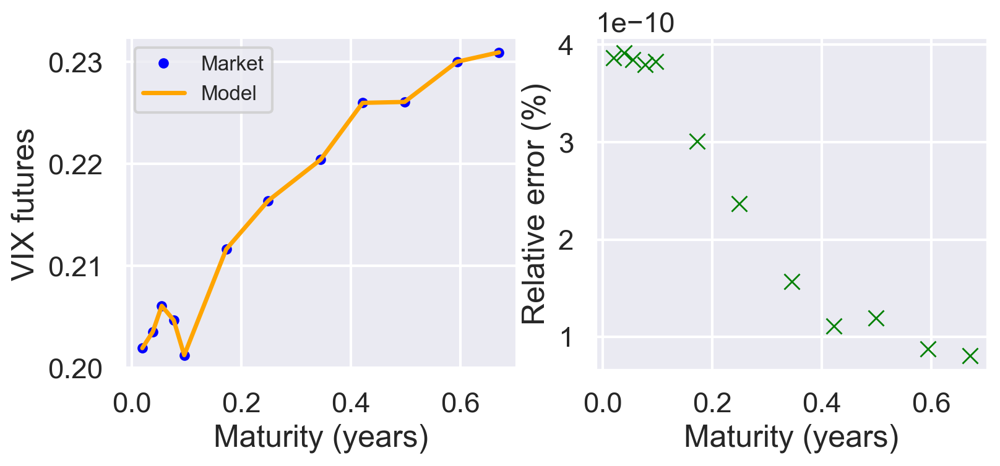

In [10]:
calibration.calibrated_plots_fwd(df_calibrated_results_fixed)

(2) Calibration results for the VIX implied volatilities

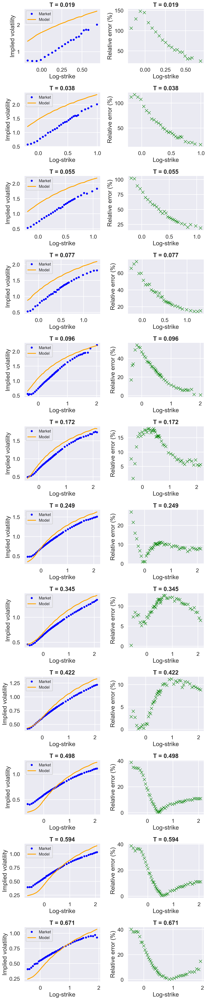

In [11]:
calibration.calibrated_plots_vix_smiles(df_calibrated_results_fixed)

From the above plots, we can see that the VIX implied volatilities obtained via the root-finding method cannot match the market data well, even though the VIX futures proxy closely matches the market term structure.This indicates that, starting from our fixed initial guess, the least-squares optimizer quickly converges to a (possibly local) minimum in a neighbourhood of the initial values, and further adjustments of the parameters do not materially reduce the objective function. To mitigate this issue, we generate 100 random initial parameter vectors and exploit a high-performance computing (HPC) cluster with a 72-core CPU to obtain improved calibration results.

##### 3.1.2 The implied volatility expansion - Formula 1

In our approximation, there are three types of formulas for the VIX implied volatility approximation, and we test them one by one.
\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{x_1} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
x_1 := k_1 - \frac{B \sigma_{P,2}}{2} - \frac{\sigma_{P,2}^2}{8},&& k_1 = \ln (\kappa), && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [12]:
import expansion_single

N_MAX = 20
N_MC = 10**6
method = 1

In [13]:
df_calib_results_fixed_1 = expansion_single.expansion_calib_fixed(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC, 
    params_init_fixed=params_init_fixed,
    method=method
)

Using 15 cores for parallel processing.

Start processing formula 1 (Fixed Guess)

Calibration results (Parameters):
              eta1      eta2    H       xi0       lbd      cost
T                                                              
0.019165  3.676739  0.341606  0.1  0.041244  0.029837  0.015982
0.038330  3.272479  0.362924  0.1  0.042499  0.046004  0.034820
0.054757  2.945686  0.359865  0.1  0.044147  0.069366  0.026310
0.076660  2.845931  0.383781  0.1  0.044638  0.098830  0.040476
0.095825  3.222400  0.456366  0.1  0.043756  0.071506  0.173837
0.172485  2.862507  0.491965  0.1  0.052188  0.135938  0.119280
0.249144  2.604181  0.490850  0.1  0.057805  0.189870  0.091910
0.344969  2.438508  0.488376  0.1  0.062725  0.222841  0.084338
0.421629  2.324531  0.489897  0.1  0.068129  0.247694  0.058553
0.498289  2.203436  0.474628  0.1  0.069991  0.278114  0.042338
0.594114  2.119273  0.466960  0.1  0.075202  0.311795  0.030838
0.670773  2.075777  0.475220  0.1  0.078424  0.3336

Unexpectedly, the calibration results are reasonably good with the same initial gueses, given that the sum of squared residuals is relatively small. However, we still plot the VIX futures term structure and the VIX smiles to further evaluate the performance of the VIX implied volatility expansion.

(1) Calibration results for the VIX futures term structure

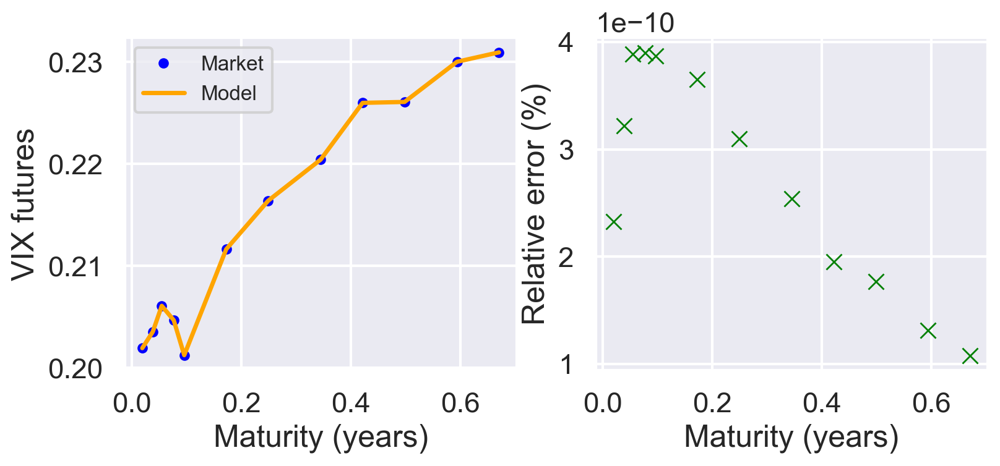

In [14]:
calibration.calibrated_plots_fwd(df_calib_results_fixed_1)

(2) Calibration results for the VIX implied volatilities

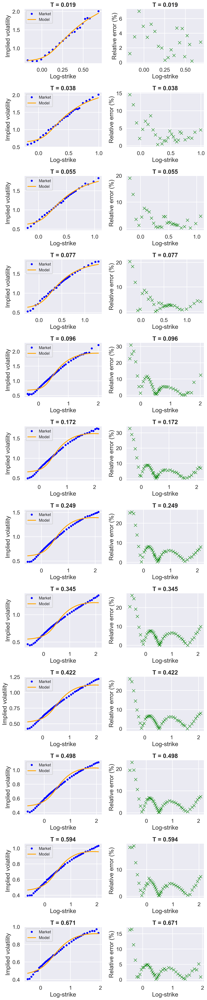

In [15]:
calibration.calibrated_plots_vix_smiles(df_calib_results_fixed_1)

##### 3.1.3 The implied volatility expansion - Formula 2

\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{x_2} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
x_2 := \ln \left(P^F\right), && k_2 := \ln \left(P^F\right) + \frac{B \sigma_{P,2}}{2} + \frac{\sigma_{P,2}^2}{8},  && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [16]:
method = 2

df_calib_results_fixed_2 = expansion_single.expansion_calib_fixed(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC, 
    params_init_fixed=params_init_fixed,
    method=method
)

Using 15 cores for parallel processing.

Start processing formula 2 (Fixed Guess)

Calibration results (Parameters):
              eta1      eta2    H       xi0       lbd      cost
T                                                              
0.019165  2.341744  0.272890  0.1  0.041319  0.092572  0.011914
0.038330  1.331170  0.139107  0.1  0.042543  0.303331  0.014933
0.054757  1.140614  0.126388  0.1  0.044057  0.390372  0.027666
0.076660  1.115836  0.181065  0.1  0.044334  0.434288  0.083436
0.095825  1.136928  0.263136  0.1  0.043624  0.420264  0.234800
0.172485  1.058465  0.324583  0.1  0.050552  0.488935  0.233412
0.249144  0.989819  0.320603  0.1  0.054250  0.544966  0.139971
0.344969  0.929593  0.306699  0.1  0.057262  0.581420  0.071921
0.421629  0.912189  0.311725  0.1  0.061114  0.593129  0.055144
0.498289  0.885750  0.314504  0.1  0.061921  0.612838  0.055572
0.594114  0.874292  0.317507  0.1  0.065136  0.626541  0.049236
0.670773  0.907529  0.330623  0.1  0.067071  0.6135

(1) Calibration results for the VIX futures term structure

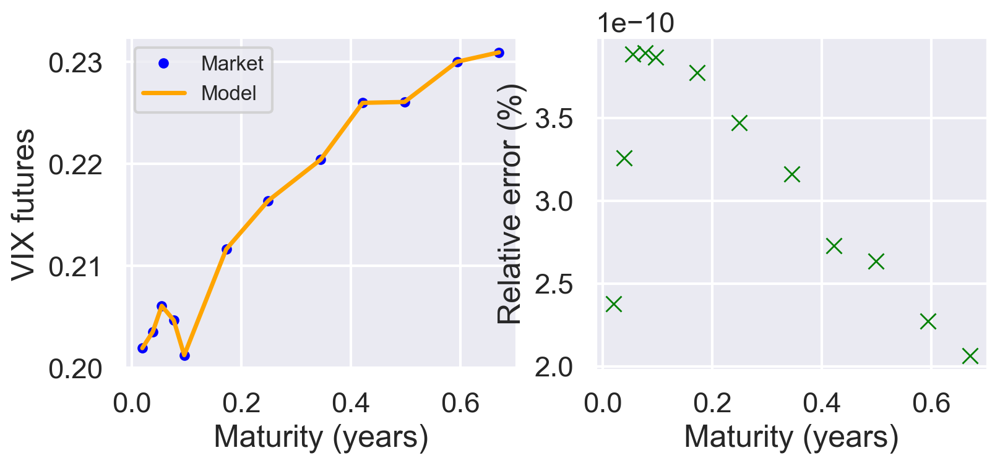

In [17]:
calibration.calibrated_plots_fwd(df_calib_results_fixed_2)

(2) Calibration results for the VIX implied volatilities

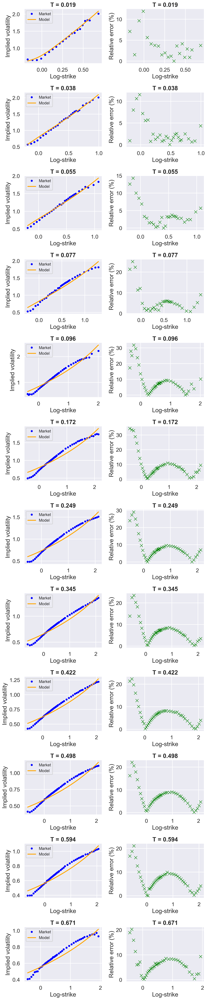

In [18]:
calibration.calibrated_plots_vix_smiles(df_calib_results_fixed_2)

##### 3.1.4 The implied volatility expansion - Formula 3

\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{\tilde{x}} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
\tilde{x} := \frac{1}{2} \left(x_1 + x_2 \right), && \tilde{k} := \frac{1}{2} \left( k_1 + k_2 \right),  && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [19]:
method = 3

df_calib_results_fixed_3 = expansion_single.expansion_calib_fixed(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC, 
    params_init_fixed=params_init_fixed,
    method=method
)

Using 15 cores for parallel processing.

Start processing formula 3 (Fixed Guess)

Calibration results (Parameters):
              eta1      eta2    H       xi0       lbd      cost
T                                                              
0.019165  2.991330  0.308644  0.1  0.041303  0.057828  0.009252
0.038330  2.378785  0.284130  0.1  0.042623  0.112682  0.006582
0.054757  2.047834  0.259297  0.1  0.044290  0.167133  0.005220
0.076660  1.865212  0.243112  0.1  0.044708  0.238125  0.003788
0.095825  2.004544  0.304416  0.1  0.043870  0.207957  0.008725
0.172485  1.706348  0.299561  0.1  0.051277  0.312996  0.006972
0.249144  1.579871  0.312231  0.1  0.055825  0.365290  0.002791
0.344969  1.515206  0.331491  0.1  0.059776  0.381800  0.003301
0.421629  1.444328  0.325321  0.1  0.064187  0.413282  0.002261
0.498289  1.368029  0.317634  0.1  0.065315  0.446052  0.001219
0.594114  1.329237  0.316012  0.1  0.069140  0.470567  0.000605
0.670773  1.321512  0.304478  0.1  0.071037  0.4905

(1) Calibration results for the VIX futures term structure

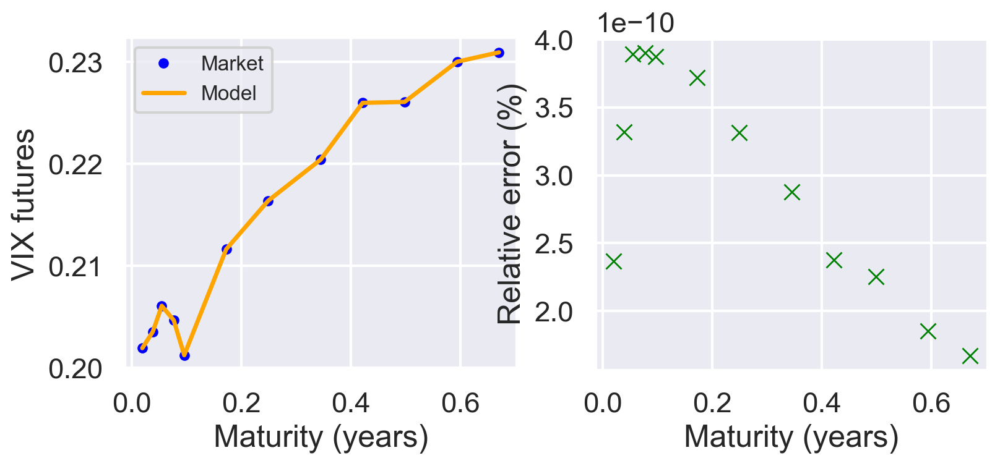

In [20]:
calibration.calibrated_plots_fwd(df_calib_results_fixed_3)

(2) Calibration results for the VIX implied volatilities

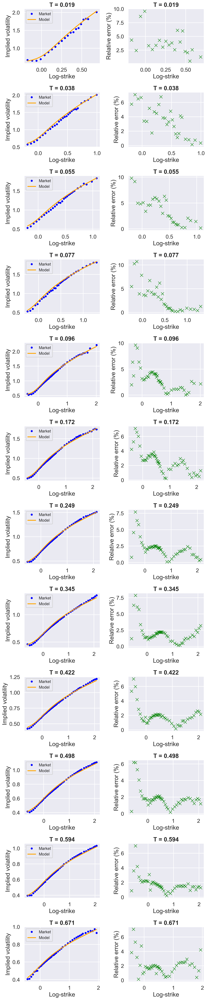

In [21]:
calibration.calibrated_plots_vix_smiles(df_calib_results_fixed_3)

The plots above indicate that the VIX implied-volatility approximation based on Formula 3 provides the best fit to market data. To enhance calibration accuracy, we generate 10 random initial parameter vectors and select the optimisation outcome with the smallest loss value. Moreover, we also use the powerful HPC to generate more than 100 random initial parameter vectors and get the best calibrated results.

In [22]:
eta_range = (0.01, 4.0)
xi0_range = (0.01, 0.1)
lbd_range = (0.01, 0.99)
N_SAMPLES = 10

In [23]:
df_calib_results_random_3 = expansion_single.expansion_calib_random(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC,
    eta_range=eta_range,
    xi0_range=xi0_range,
    lbd_range=lbd_range,
    N_SAMPLES=N_SAMPLES,
    method=method
)

Using 15 cores for parallel processing.

Start processing formula 3 (Random Guess)

Calibration results (Parameters):
              eta1      eta2    H       xi0       lbd      cost  \
T                                                                 
0.019165  2.458383  0.271796  0.1  0.041667  0.149794   0.00909   
0.038330  2.488283  0.289902  0.1  0.042477  0.089745  0.006143   
0.054757  2.156331  0.265469  0.1  0.044059  0.134628  0.005128   
0.076660  1.918441  0.245767  0.1  0.044526  0.216046  0.003779   
0.095825   2.10752   0.31039  0.1  0.043461   0.16932  0.008367   
0.172485  1.527525  0.285827  0.1  0.052291  0.408824    0.0066   
0.249144  1.630687   0.31638  0.1  0.055468  0.338204  0.002738   
0.344969  1.621202  0.340941  0.1  0.058961   0.32575  0.002464   
0.421629  1.548864  0.334225  0.1   0.06335  0.356413   0.00166   
0.498289  1.471508  0.328043  0.1  0.064582  0.387846  0.001053   
0.594114  1.377881  0.321657  0.1  0.068868  0.442962  0.000601   
0.670773  0

(1) Calibration results for the VIX futures term structure

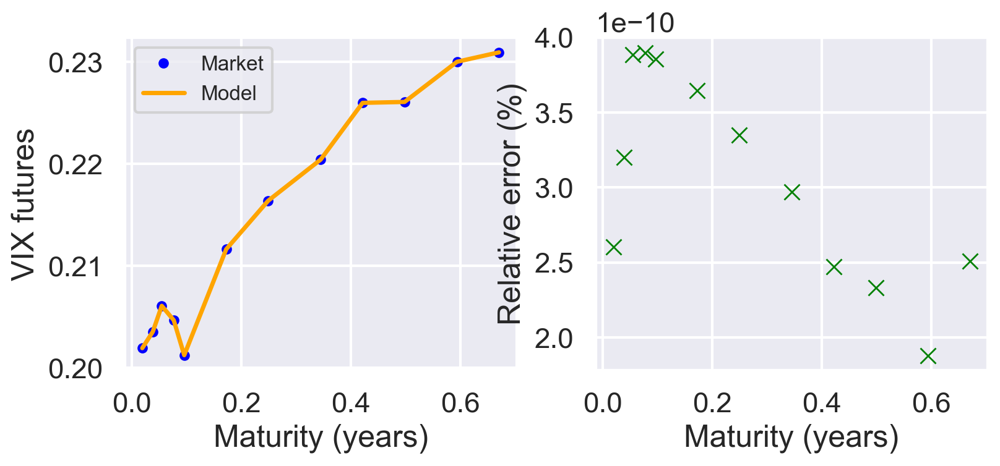

In [24]:
calibration.calibrated_plots_fwd(df_calib_results_random_3)

(2) Calibration results for the VIX implied volatilities

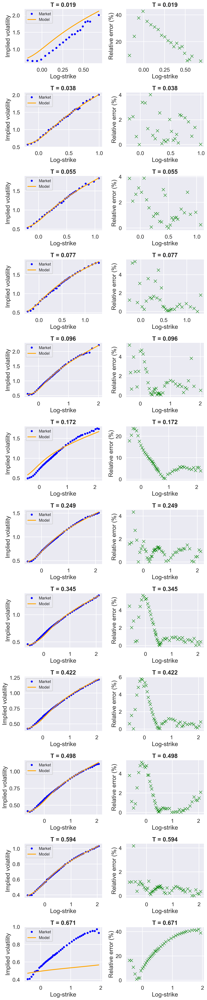

In [25]:
calibration.calibrated_plots_vix_smiles(df_calib_results_random_3)

#### 3.2 Calibration to mutliple maturities

In the following section, we focus only on our implied volatility approximation. In the previous calibration, we only calibrate the model to one specified series of the VIX implied volatility. In this section, we consider calibrating the model to multiple series group by the maturity. From the data preprocessing and data visulization step, we know that there are total 12 maturities series, and we group then using the partion $T \in [1/12, 2/12)$, $T \in [2/12, 3/12)$, and so far so on.

In [27]:
import expansion_global

df_global_calib_results_fixed_3 = expansion_global.expansion_global_calib_fixed(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC, 
    params_init_fixed=params_init_fixed,
    method=method
)

Using 15 cores for parallel processing.

Start processing formula 3 (Fixed Guess)


c:\Users\Spencer\Desktop\Chapter2\Code\version_4\expansion_global.py:162: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bucket_groups = list(market_data_df.groupby('Bucket'))



Calibration results (Parameters):
              eta1      eta2    H       lbd       xi0      cost  initial_guess
T                                                                             
0.019165  2.224070  0.255397  0.1  0.130103  0.041436  0.240770            NaN
0.038330  2.224070  0.255397  0.1  0.130103  0.042592  0.240770            NaN
0.054757  2.224070  0.255397  0.1  0.130103  0.044020  0.240770            NaN
0.076660  2.224070  0.255397  0.1  0.130103  0.043810  0.240770            NaN
0.095825  2.084939  0.309164  0.1  0.177392  0.043549  0.008420            NaN
0.172485  1.722428  0.317347  0.1  0.299384  0.051238  0.039552            NaN
0.249144  1.722428  0.317347  0.1  0.299384  0.054926  0.039552            NaN
0.344969  1.573070  0.336819  0.1  0.350805  0.059348  0.002834            NaN
0.421629  1.464728  0.328925  0.1  0.396866  0.063882  0.007038            NaN
0.498289  1.464728  0.328925  0.1  0.396866  0.064889  0.007038            NaN
0.594114  1.37984

(1) Calibration results for the VIX futures term structure

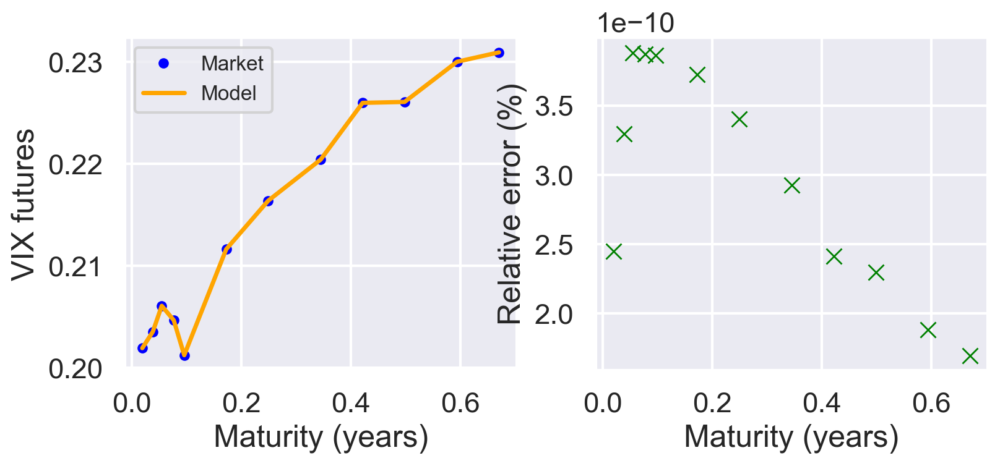

In [28]:
calibration.calibrated_plots_fwd(df_global_calib_results_fixed_3)

(2) Calibration results for the VIX implied volatilities

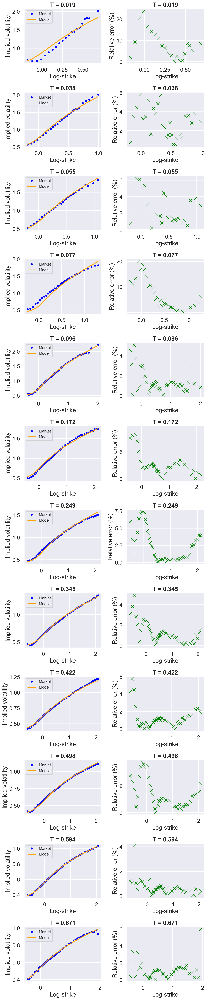

In [29]:
calibration.calibrated_plots_vix_smiles(df_global_calib_results_fixed_3)

The second step in this calibration test is that we randomly choose 10 different initial parameter vectors as the start point and select the smallest errors. We still use the powerful HPC to get the higher accuracy calibration results with more 10 different initial parameter guesses. The step requires high performance cluste (HPC) to get the results in a reasonable time, thus, we do not run the following code.

In [ ]:
eta_range = (0.01, 4.0)
xi0_range = (0.01, 0.1)
lbd_range = (0.01, 0.99)
N_SAMPLES = 10

In [ ]:
df_global_calib_results_random_3 = expansion_global.expansion_global_calib_random(
    market_data_df=df, 
    H=H, 
    N_MAX=N_MAX, 
    N_MC=N_MC,
    eta_range=eta_range,
    xi0_range=xi0_range,
    lbd_range=lbd_range,
    N_SAMPLES=N_SAMPLES,
    method=method
)

(1) Calibration results for the VIX futures term structure

In [ ]:
calibration.calibrated_plots_fwd(df_global_calib_results_random_3)

(2) Calibration results for the VIX implied volatilities

In [ ]:
calibration.calibrated_plots_vix_smiles(df_global_calib_results_random_3)